# Birds Classification with InceptionV3 + Fine Tuning + GradCAM
By Bobby Cheng

Welcome to my Birds Classification Deep Learning Python Notebook. 

## 1. Problem Statement

Human activities such as deforestation, climate change and waste pollution harm the habitats and food supplies of birds. Over long periods of time, these result in declining populations per species and sometimes extinction. As such, there is value investing into the conservation and protection of endangered bird species. One challenge in these efforts lie in the accurate identification of birds. If we can automate the accurate identification of birds, these efforts will be less time-consuming and error-prone; enabling researchers to channel their time into other important areas.

Fortunately, deep learning has made it possible to aid these conservation efforts. In this article, I'll provide an example of how the use of pretrained CNNs can be used to aid the identification of 525 bird species. Along the way, I'll aim to answer the following questions:

1. Why are pretrained models more advantageous?
2. How to improve pretrained models through fine-tuning?
3. What patterns of a bird species is identified by the CNN to label them correctly?

## 2. Loading and Preparing the Data

I downloaded from the following Kaggle webpage here. Upon downloading it, the .zip file contained 2 files and 3 folders titled Train, Validation, and Test. These  3 folders will be used for our purposes.

In [1]:
import os, shutil

original_dataset_dir = 'Birds525/train'

print("The number of bird species we are predicting for are", len([folder for folder in os.listdir(original_dataset_dir) if not folder.startswith('.')]), ".")

The number of bird species we are predicting for are 525 .


In [2]:
## Create a dataframe for each folder category of the BIRDS 525 data set

# system libraries
from pathlib import Path
import pandas as pd

######################### TRAIN #########################
train_path = 'Birds525/train'

train_dir = Path(train_path)

filepaths = list(train_dir.glob(r'**/*.JPG')) + list(train_dir.glob(r'**/*.jpg')) + list(train_dir.glob(r'**/*.png')) + list(train_dir.glob(r'**/*.png'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

train_df = pd.concat([filepaths, labels], axis=1)

######################### VALIDATION #########################

val_path = 'Birds525/valid'

val_dir = Path(val_path)

filepaths = list(val_dir.glob(r'**/*.JPG')) + list(val_dir.glob(r'**/*.jpg')) + list(val_dir.glob(r'**/*.png')) + list(val_dir.glob(r'**/*.png'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

val_df = pd.concat([filepaths, labels], axis=1)

######################### TEST #########################

test_path = 'Birds525/test'

test_dir = Path(test_path)

filepaths = list(test_dir.glob(r'**/*.JPG')) + list(test_dir.glob(r'**/*.jpg')) + list(test_dir.glob(r'**/*.png')) + list(test_dir.glob(r'**/*.png'))
labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

test_df = pd.concat([filepaths, labels], axis=1)


In [3]:
## Creating our train and validation generators in the absence of any data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Rescale all images by 1/255. 
# Neural Networks work better with smaller input values
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)

train_generator = train_datagen.flow_from_dataframe(train_df
                                                   ,x_col='Filepath'
                                                   ,y_col='Label'
                                                   ,target_size = (150, 150)
                                                   ,batch_size = 20
                                                   ,shuffle = True
                                                   )

# The validation generator will leverage off our test data generator because we'll want to test our trained model on the same properties
validation_generator = test_datagen.flow_from_dataframe(val_df
                                                       ,x_col='Filepath'
                                                       ,y_col='Label'
                                                       ,target_size = (150, 150)
                                                       ,batch_size = 20
                                                       )

test_generator = test_datagen.flow_from_dataframe(test_df
                                                  ,x_col='Filepath'
                                                  ,y_col='Label'
                                                  ,target_size = (150, 150)
                                                  ,batch_size = 20
                                                  ,shuffle = False
                                                       )

Found 84635 validated image filenames belonging to 525 classes.
Found 2625 validated image filenames belonging to 525 classes.
Found 2625 validated image filenames belonging to 525 classes.


## 3. Exploratory Data Analysis (EDA)

In [4]:
## explore the train generator

for data_batch, labels_batch in train_generator:
    print('data batch shape:', data_batch.shape)
    print('labels batch shape:', labels_batch.shape)
    data_batch_check = data_batch
    labels_batch_check = labels_batch
    break

data batch shape: (20, 150, 150, 3)
labels batch shape: (20, 525)


Printing the Image of Index 5 for current batch.
Showing the image: 


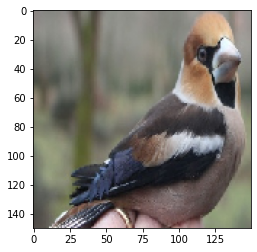


Showing the data shape: 
(150, 150, 3)

Showing the label:
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

In [5]:
## Show a sample bird image, and highlight its shape and it's label array

import matplotlib.pyplot as plt

index = 5
print("Printing the Image of Index {} for current batch.".format(index))
print("Showing the image: ")
plt.imshow(data_batch_check[index])
plt.show()

print("\nShowing the data shape: ")
print(data_batch_check[index].shape)

print("\nShowing the label:")
print(labels_batch_check[index])


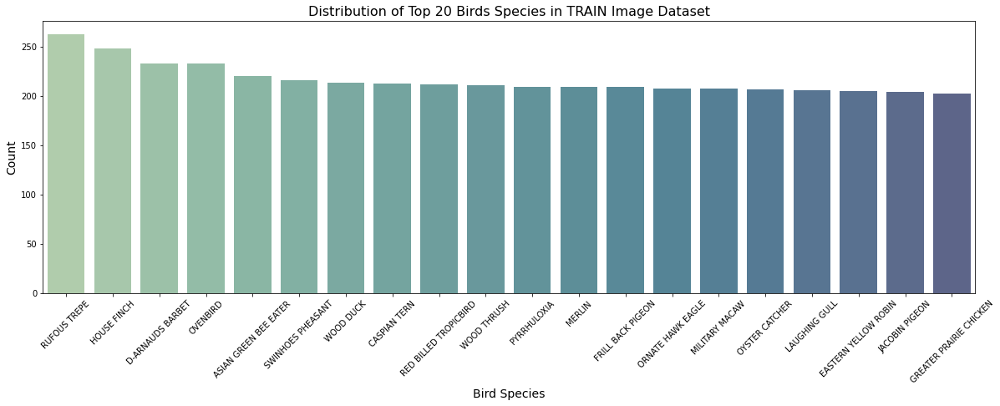

In [6]:
## what are the top 20 labels in the Image Dataset? 

import seaborn as sns

# Get the top 20 labels
label_counts = train_df['Label'].value_counts()[:20]

plt.figure(figsize=(20, 6))
sns.barplot(x=label_counts.index, y=label_counts.values, alpha=0.8, palette='crest')
plt.title('Distribution of Top 20 Birds Species in TRAIN Image Dataset', fontsize=16)
plt.xlabel('Bird Species', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.show()

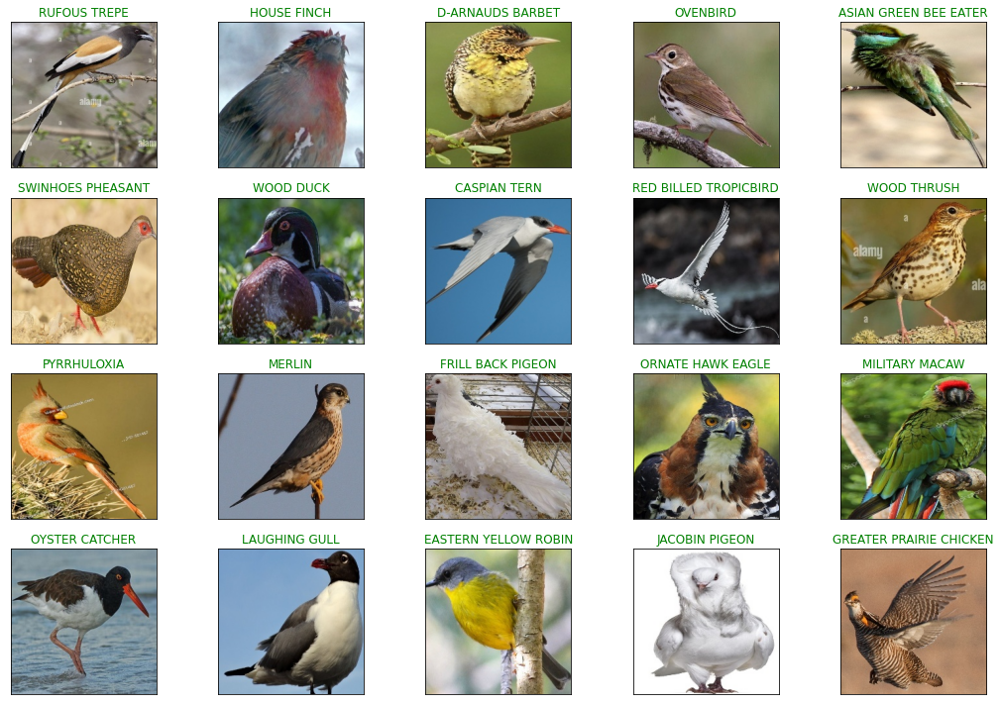

In [7]:
## print out the images of these top 20 bird species

dedup_train_df = train_df.drop_duplicates('Label')
dedup_train_df = dedup_train_df[dedup_train_df['Label'].isin(label_counts.index)]

dedup_train_df['Label'] = pd.Categorical(dedup_train_df['Label'], categories = label_counts.index)
dedup_train_df.sort_values('Label', inplace = True)
dedup_train_df.reset_index(drop = True, inplace = True)

fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(dedup_train_df.Filepath[i]))
    ax.set_title(dedup_train_df.Label[i], color = 'green')
plt.tight_layout()
plt.show()


<Figure size 432x288 with 0 Axes>

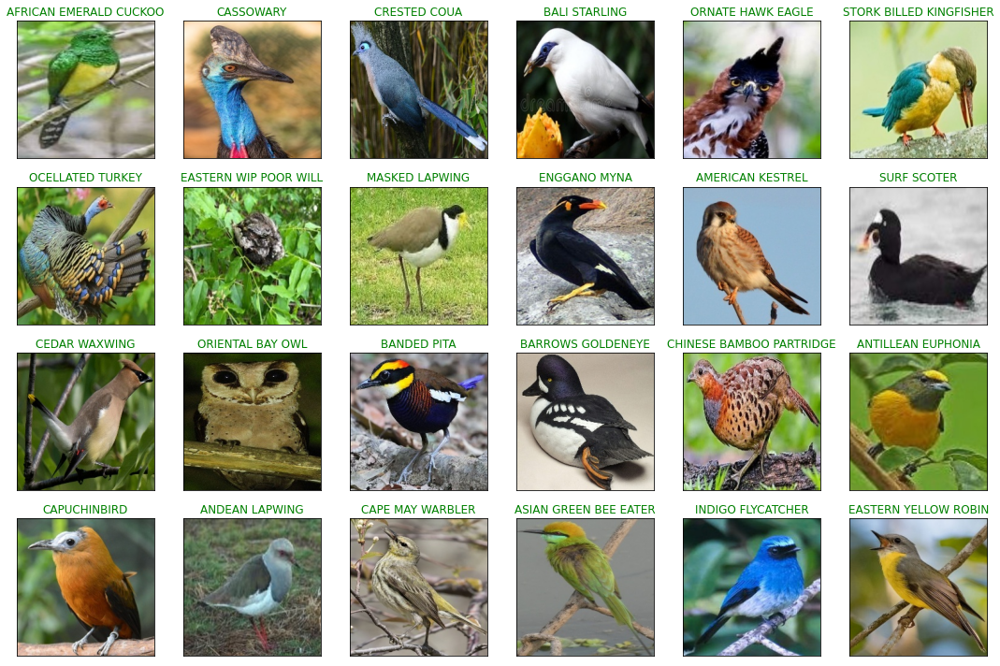

In [102]:
## print a random set of birds to have an idea of the type of images we are training with

import numpy as np 

# Display 24 birds of the TRAIN dataset with their labels
random_index = np.random.randint(0, len(train_df), 24)
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(train_df.Filepath[random_index[i]]))
    ax.set_title(train_df.Label[random_index[i]], color = 'green')
plt.tight_layout()
plt.show()

In [9]:
# train a set of new functions that allows us to determine the decay in photo quality due to compression

def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    SCALE = 15
    orig_img = cv2.imread(path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
    
    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    # read compressed image
    compressed_img = cv2.imread(temp_filename)

    # get absolute difference between img1 and img2 and multiply by scale
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    return diff


def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpeg'
    ela_filename = 'temp_ela.png'
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)

    ela_image = ImageChops.difference(image, temp_image)

    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1

    scale = 255.0 / max_diff
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    
    return ela_image


def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')
        
    items = list(items)
        
    p = random.choice(items)
    return p.as_posix()

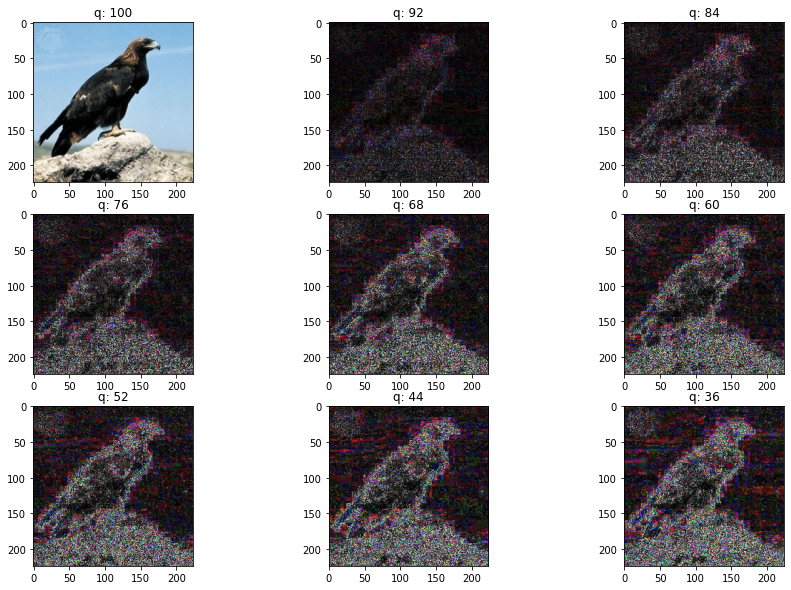

In [10]:
import cv2
import random
import matplotlib.pyplot as plt

# View random sample from the dataset
p = random_sample('Birds525/train/GOLDEN EAGLE')
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 8
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i) 
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

## 4. Baseline Convolutional Neural Network (CNN)

In [ ]:
# instantiate a baseline CNN for Birds Classification
from tensorflow.keras import models, layers

## adding a base CNN network
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation = 'relu', input_shape = (150,150,3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation = 'relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation = 'relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation = 'relu'))
model.add(layers.MaxPooling2D((2, 2)))

## adding a classifier
model.add(layers.Flatten())
model.add(layers.Dense(512, activation = 'relu'))
model.add(layers.Dense(525, activation = 'softmax'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

2023-06-06 10:31:20.414920: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2023-06-06 10:31:20.414972: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (ip-172-31-22-152): /proc/driver/nvidia/version does not exist
2023-06-06 10:31:20.415536: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [ ]:
## compile the model for training
from tensorflow.keras import optimizers

model.compile(loss = 'categorical_crossentropy'
             ,optimizer = optimizers.RMSprop(learning_rate = 1e-4)
             ,metrics = ['acc'])

In [ ]:
## history of the initial network training
history = model.fit(train_generator
         ,steps_per_epoch = 100
         ,epochs = 100
         ,validation_data = validation_generator
         ,validation_steps = 50)

Epoch 1/100
100/100 [==============================] - 23s 225ms/step - loss: 6.2634 - acc: 5.0000e-04 - val_loss: 6.2634 - val_acc: 0.0010
Epoch 2/100
100/100 [==============================] - 22s 222ms/step - loss: 6.2631 - acc: 0.0035 - val_loss: 6.2584 - val_acc: 0.0050
Epoch 3/100
100/100 [==============================] - 22s 220ms/step - loss: 6.2409 - acc: 0.0030 - val_loss: 6.2177 - val_acc: 0.0110
Epoch 4/100
100/100 [==============================] - 22s 223ms/step - loss: 6.1966 - acc: 0.0060 - val_loss: 6.1563 - val_acc: 0.0030
Epoch 5/100
100/100 [==============================] - 22s 221ms/step - loss: 6.0963 - acc: 0.0100 - val_loss: 6.0588 - val_acc: 0.0110
Epoch 6/100
100/100 [==============================] - 23s 226ms/step - loss: 5.9901 - acc: 0.0120 - val_loss: 5.9143 - val_acc: 0.0140
Epoch 7/100
100/100 [==============================] - 23s 230ms/step - loss: 5.8900 - acc: 0.0195 - val_loss: 5.8144 - val_acc: 0.0230
Epoch 8/100
100/100 [=======================

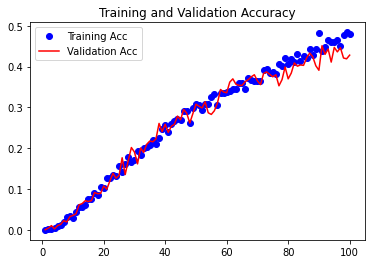

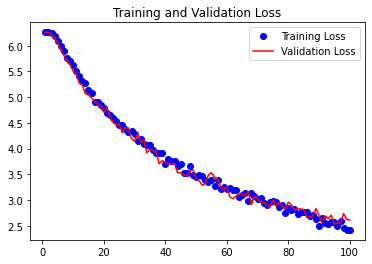

In [ ]:
# Plot a learning curve.
# The learning curve will help us monitor if our baseline model is overfitting or underfitting.

import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label = 'Training Acc')
plt.plot(epochs, val_acc, 'r', label = 'Validation Acc')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label = 'Training Loss')
plt.plot(epochs, val_loss, 'r', label = 'Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.show()

In [ ]:
# Save the model
model.save('birds525_baseline_1.h5')

In [11]:
from tensorflow.keras import models, layers

model = models.load_model('birds525_baseline_1.h5')

2023-06-22 06:03:19.731303: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2023-06-22 06:03:19.731348: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (ip-172-31-22-152): /proc/driver/nvidia/version does not exist
2023-06-22 06:03:19.732343: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [12]:
test_loss, test_acc = model.evaluate(test_generator, steps = 50)
print('test acc:', test_acc)

29/50 [================>.............] - ETA: 1s - loss: 2.3049 - acc: 0.5069

50/50 [==============================] - 3s 50ms/step - loss: 2.4767 - acc: 0.4590
test acc: 0.45899999141693115


**Author's Note:**

Firstly, the above learning curve shows the training and validation accuracies being similar with one another as the epochs go. Around the 75th epoch, we see signs of slight overfitting as the validation tapers away from the training accuracy. For computer vision exercises, it is good to overfit the model before we take necessary steps to underfit it.

Secondly, the test evaluation highlights that the baseline model achieved 45% accuracy. This means about 1 in every 2 birds will be correctly predicted. Let us now attempt to adopt the use of pretrained networks and observe if it predicts better than our baseline network.

## 5. Feature Extraction Using Inception V3 as a Pretrained Network

**What's a pretrained network?** It is a network that has been previously trained on a larger dataset that is usually a large multi-class image exercise. In theory, the diverse set of images it has learnt would have given it a spatial hierarchy of features that could be used as a generic model for new image predictions. Hence, we can repurpose these pretrained models for new image labelling exercises.

**What does feature extraction mean?** It describes the process of using the patterns learnt by a previous network to extract new sets of patterns from new image inputs. 

**Why use Inception V3 as a pretrained model?** Inception V3 has proven to be a more efficient architecture based on the number of parameters generated and the memory costs of it. Moreover, this third version introduces several techniques such as factorised convolutions, smaller convolutions, and assymetric convolutions to make it more adaptable on new data.

In [ ]:
# get the Inception V3 base model
from tensorflow.keras.applications import InceptionV3

# set the base model without its dense classifier, with input shape = 150 x 150, and freeze it
base_model = InceptionV3(include_top = False, input_shape = (150, 150, 3))
base_model.trainable = False

base_model.summary()

2023-06-08 03:46:02.820607: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2023-06-08 03:46:02.820660: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (ip-172-31-22-152): /proc/driver/nvidia/version does not exist
2023-06-08 03:46:02.821192: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                       

In [ ]:
from tensorflow.keras import layers, models

# define the hidden layers
x = base_model.get_layer('mixed10').output # mixed10 is the last layer of the base_model
x = layers.GlobalAveragePooling2D()(x) # global average is preferred over flatten becuase the lesser variables makes the network more efficient

# define the output layer
outputs = layers.Dense(525, activation = 'softmax')(x)

# create the model
model = models.Model(base_model.input, outputs)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                              

In [ ]:
# compile the model for training
from tensorflow.keras import optimizers

model.compile(loss = 'categorical_crossentropy'
             ,optimizer = optimizers.Adam(learning_rate = 0.01)
             ,metrics = ['acc'])

In [ ]:
# training with flattened CNN
history = model.fit(train_generator
         ,steps_per_epoch = len(train_generator)
         ,epochs = 10
         ,validation_data = validation_generator
         ,validation_steps = int(0.25*len(validation_generator)))

Epoch 1/10
4232/4232 [==============================] - 530s 125ms/step - loss: 42.8444 - acc: 0.3950 - val_loss: 28.6408 - val_acc: 0.5985
Epoch 2/10
4232/4232 [==============================] - 514s 121ms/step - loss: 33.2724 - acc: 0.5860 - val_loss: 25.8466 - val_acc: 0.6409
Epoch 3/10
4232/4232 [==============================] - 514s 121ms/step - loss: 27.9465 - acc: 0.6588 - val_loss: 26.1310 - val_acc: 0.7030
Epoch 4/10
4232/4232 [==============================] - 514s 121ms/step - loss: 24.3120 - acc: 0.7052 - val_loss: 40.3555 - val_acc: 0.6364
Epoch 5/10
4232/4232 [==============================] - 514s 122ms/step - loss: 21.2534 - acc: 0.7388 - val_loss: 29.1519 - val_acc: 0.7106
Epoch 6/10
4232/4232 [==============================] - 513s 121ms/step - loss: 19.0405 - acc: 0.7629 - val_loss: 29.1201 - val_acc: 0.7333
Epoch 7/10
4232/4232 [==============================] - 512s 121ms/step - loss: 16.9078 - acc: 0.7880 - val_loss: 29.1889 - val_acc: 0.7106
Epoch 8/10
4232/4232

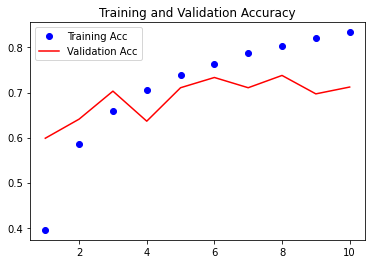

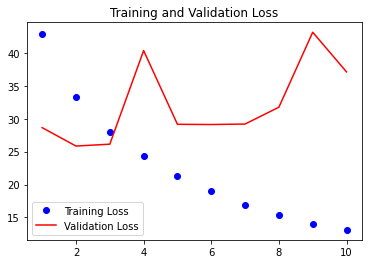

In [ ]:
# plot learning curve
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc)+1)

plt.plot(epochs, acc, 'bo', label = 'Training Acc')
plt.plot(epochs, val_acc, 'r', label = 'Validation Acc')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label = 'Training Loss')
plt.plot(epochs, val_loss, 'r', label = 'Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.show()

In [ ]:
test_loss, test_acc = model.evaluate(test_generator, steps = 50)
print('test acc:', test_acc)

50/50 [==============================] - 6s 122ms/step - loss: 34.0547 - acc: 0.7200
test acc: 0.7200000286102295


**Author's Note:**

Firstly, the learning curve shows that overfitting was achieved from the 4th epoch onwards. This means we can now implement regularization techniques to reduce overfitting. However, for the purposes of our example, we'll proceed to adopt fine tuning.

Secondly, the test evaluation highlights that the use of a pretrained model such as Inception V3 achieved 72% accuracy. This is a ~20% lift in accuracy from the baseline network! I will now attempt to see if fine-tuning will help improve the classifier's accuracy.

## 6. Fine-tuning our Pretrained Model

**What does fine-tuning mean?** Fine-tuning usually goes hand-in-hand with feature extraction. It is the process of unfreezing a few top layers of the frozen base model to allow for the base model to tweak the more specific patterns of the pretrained model to be relevant for the new input images.

**A common question one might ask is "*why not unfreeze the earlier layers of the network?*"** The reason we unfreeze the later layers is for the same reason why we add a custom network on top of the base network - top (or later) layers typically encode more specific patterns than the earlier layers. Hence, it is more practical to fine-tune these specific patterns to the purposes of our new input images.

In [24]:
## fine-tuning of the above model. For this, we will unfreeze the top most 12 layers.
## These 12 layers are from the top 10 of the base model, and the newly added network.

model.trainable = True

# Un-freeze last 12 layers
for layer in model.layers[:-12]:
    layer.trainable = False

In [26]:
## with the unfreezing of the top most 12 layers, we will recompile it using a smaller learning rate.

model.compile(loss = 'categorical_crossentropy'
             ,optimizer = optimizers.Adam(learning_rate = 0.001)
             ,metrics = ['acc'])


In [27]:
initial_epochs = 10
fine_tune_epochs = initial_epochs + 3

# Refit the model
history_2 = model.fit(train_generator,
                       epochs = fine_tune_epochs,
                       validation_data = validation_generator,
                       validation_steps = int(0.25*len(validation_generator)),
                       initial_epoch =  history.epoch[-1],) # Start the epoch where it left before

Epoch 10/13
4232/4232 [==============================] - 530s 124ms/step - loss: 3.0049 - acc: 0.9369 - val_loss: 20.7887 - val_acc: 0.8015
Epoch 11/13
4232/4232 [==============================] - 522s 123ms/step - loss: 1.3796 - acc: 0.9607 - val_loss: 19.8140 - val_acc: 0.7970
Epoch 12/13
4232/4232 [==============================] - 523s 124ms/step - loss: 0.9091 - acc: 0.9697 - val_loss: 14.7037 - val_acc: 0.7970
Epoch 13/13
4232/4232 [==============================] - 522s 123ms/step - loss: 0.6225 - acc: 0.9756 - val_loss: 21.1084 - val_acc: 0.7803


In [28]:
test_loss, test_acc = model.evaluate(test_generator, steps = 50)
print('test acc:', test_acc)

50/50 [==============================] - 6s 120ms/step - loss: 15.1794 - acc: 0.8400
test acc: 0.8399999737739563


**Author's Note:**

Unsurprisingly, the test evaluation highlights that fine-tuning has helped the pretrained network achieve 84% accuracy; giving another ~12% lift in accuracy. This suggests that the use of fine tuning pretrained models after feature extraction does produce better bird image classifiers. With an accuracy of 84%, we will proceed to evaluate our classifier's performance by the species.

In [30]:
# Save the model
model.save('birds525_inceptionv3_1.h5')

In [13]:
from tensorflow.keras import models, layers

model = models.load_model('birds525_inceptionv3_1.h5')

## 7. Image Classifier's Prediction Report Book

### 7.1. Are there any bird species that are not accurately predicted by the CNN?

In [15]:
import numpy as np

# use the model to predict all test images
pred = model.predict(test_generator)
pred = np.argmax(pred, axis = 1)

# Map the label
labels = (test_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred = [labels[k] for k in pred]

In [16]:
from sklearn.metrics import classification_report, confusion_matrix

y_test = list(test_df.Label)
report = classification_report(y_test, pred, output_dict=True)
df = pd.DataFrame(report).transpose()
df

/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,precision,recall,f1-score,support
ABBOTTS BABBLER,1.000000,0.60000,0.750000,5.00000
ABBOTTS BOOBY,0.666667,0.40000,0.500000,5.00000
ABYSSINIAN GROUND HORNBILL,0.833333,1.00000,0.909091,5.00000
AFRICAN CROWNED CRANE,1.000000,1.00000,1.000000,5.00000
AFRICAN EMERALD CUCKOO,1.000000,0.80000,0.888889,5.00000
...,...,...,...,...
YELLOW HEADED BLACKBIRD,0.833333,1.00000,0.909091,5.00000
ZEBRA DOVE,0.800000,0.80000,0.800000,5.00000
accuracy,0.836190,0.83619,0.836190,0.83619
macro avg,0.858970,0.83619,0.831404,2625.00000


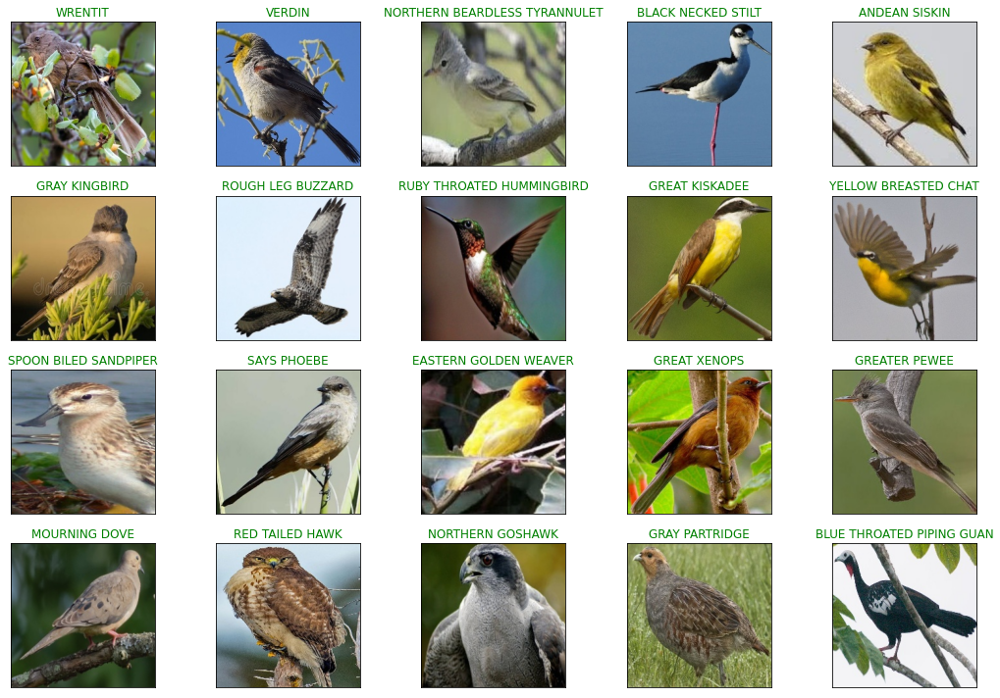

In [17]:
## print out the bottom 20 bird species that were not accurately predicted by our CNN

report_df = df.iloc[:-3].copy()
bottom20_birds_array = report_df.sort_values('f1-score')[:20].index

## print out the images of these top 20 bird species

dedup_train_df = train_df.drop_duplicates('Label')
dedup_train_df = dedup_train_df[dedup_train_df['Label'].isin(bottom20_birds_array)]

dedup_train_df['Label'] = pd.Categorical(dedup_train_df['Label'], categories = bottom20_birds_array)
dedup_train_df.sort_values('Label', inplace = True)
dedup_train_df.reset_index(drop = True, inplace = True)

fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(dedup_train_df.Filepath[i]))
    ax.set_title(dedup_train_df.Label[i], color = 'green')
plt.tight_layout()
plt.show()

### 7.2. Can we visualise how our model makes predictions?

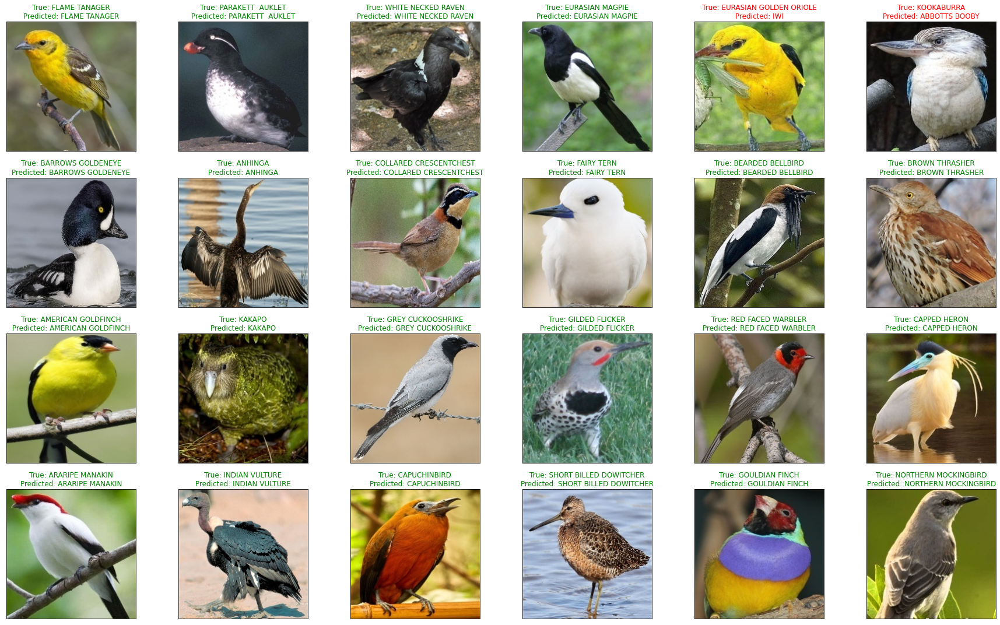

In [105]:
# with the predicted test images, let's take a look at how our model performs

import matplotlib.pyplot as plt

# Display 24 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 24)
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)

plt.tight_layout()
plt.show()


## 8. Visualise the learnings of our Pretrained CNN using Gradient Class Activation Mapping (Grad-CAM)

In this section, we will use Grad-CAM to visualise what our model is learning. This technique helps us identify parts of an image that belong to a given class. As such, it allows users to localise objects in images. 

The undermentioned section were adapted from KERAS vision example for Grad-CAM (link [here](https://keras.io/examples/vision/grad_cam/#lets-try-another-image)). Personally, I felt this example from KERAS is very fuss free to immediately apply and observe how Grad-CAM can be handy because it downloads the picture of the elephant from the web. Hence, you can pluck it conveniently on a virtual machine or your local machine IDE. However, if you are using CNNs with pre-trained based models, you'll face an error with this KERAS code guide. The main trouble lies with facing 'disconnected graphs' when you're extracting from a layer within the 'base model' layer (i.e. model.get_layer('inception_v3').get_layer('mixed10').output). This is the same for most Grad-CAM examples on the web - they are demonstrated with plug-in models with no pre-training efforts.  

Fortunately, I came across someone who had the same problem (link [here]( https://github.com/tensorflow/tensorflow/issues/44462)). As of June 2023, the author tried to flatten their model by using a functional API so that model.summary() will show all layers of the base model. However, the author still encountered a 'disconnected graph'. Stubbornly, I decided to try the flattening approach as well.

I learnt to flatten the model by referencing these two links (link 1 [here](https://stackoverflow.com/questions/68463498/how-to-display-the-layers-of-a-pretrained-model-instead-of-a-single-entry-in-mod), and link 2 [here](https://github.com/keras-team/keras/issues/10450#issuecomment-397757556)). After flattening the model, I retried the approach I learnt from KERAS. Alas, I had a successful Grad-CAM Visualisation implementation with a pre-trained base model.


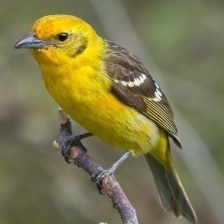

In [138]:
from IPython.display import Image, display
import matplotlib.cm as cm

# setting parameters
img_size = (150,150)
last_conv_layer_name = "conv2d_84" 
img_path = test_df.Filepath.iloc[random_index[0]]

# display the image
display(Image(img_path))

In [36]:
# create functions

import tensorflow as tf
from tensorflow import keras

def get_img_array(img_path, size):
    # `img` is a PIL image of size 299x299
    img = keras.utils.load_img(img_path, target_size=size)
    # `array` is a float32 Numpy array of shape (299, 299, 3)
    array = keras.utils.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size (1, 299, 299, 3)
    array = np.expand_dims(array, axis=0)
    return array


def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

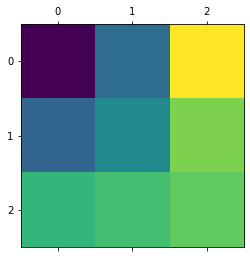

In [139]:
# Prepare image
from tensorflow.keras.utils import load_img, img_to_array

img = load_img(img_path, target_size = img_size)
img_array = img_to_array(img)
img_array = img_array * (1. / 255)
img_array = img_array.reshape((1, img_array.shape[0], img_array.shape[1], img_array.shape[2]))

# Remove last layer's softmax
model.layers[-1].activation = None

# Print what the top predicted class is
preds = model.predict(img_array)

# Generate class activation heatmap
heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

# Display heatmap
plt.matshow(heatmap)
plt.show()

In [37]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.9, return_images = False):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    if return_images:
        display(Image(cam_path))

    return cam_path

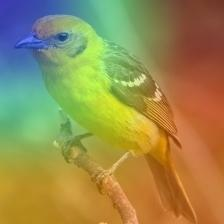

In [140]:
def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.9, return_images = False):
    # Load the original image
    img = keras.utils.load_img(img_path)
    img = keras.utils.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
    if return_images:
        display(Image(cam_path))

    return cam_path


_ = save_and_display_gradcam(img_path, heatmap, return_images = True)

##### Author's Note:

The more darkred regions are the localised areas of a picture that belongs to the given labelled prediction.

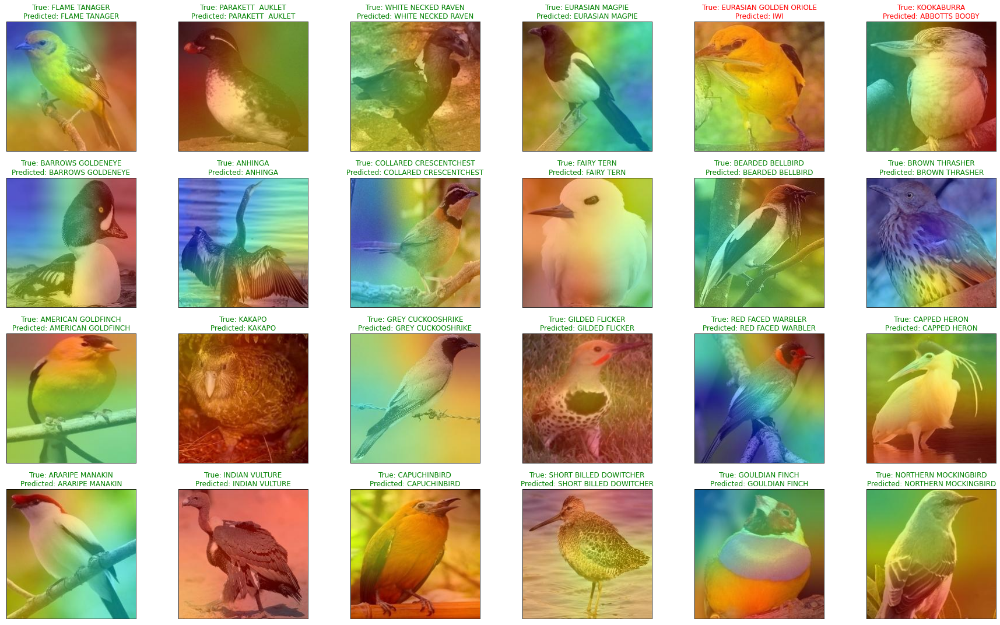

In [137]:
# with the predicted test images, let's take a look at how our model performs

import matplotlib.pyplot as plt

# Display 24 random pictures from the dataset with their labels
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    # load the image
    img_path = test_df.Filepath.iloc[random_index[i]]
    
    # prepare the image_array
    img = load_img(img_path, target_size = img_size)
    img_array = img_to_array(img)
    img_array = img_array * (1. / 255)
    img_array = img_array.reshape((1, img_array.shape[0], img_array.shape[1], img_array.shape[2]))

    # prepare the heatmap array
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    # plot the image
    ax.imshow(plt.imread(cam_path))
    # ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"True: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred[random_index[i]]}", color=color)

plt.tight_layout()
plt.show()
